In [21]:
#Initialization
from platform import python_version
import tensorflow as tf
import librosa as lb
import audiomentations as augs
# import diskcache as dc
import functools
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from collections import defaultdict
import soundfile as sf
import random

from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, accuracy_score




import warnings
warnings.filterwarnings("ignore") #ignore warnings

import data_loader_cache as dlc # data loading & processing functions from optimised_engine_pipeline_MASTER

# print system information
print('Python Version           : ', python_version())
print('TensorFlow Version       : ', tf.__version__)
print('Librosa Version          : ', lb.__version__)
print('Audiomentations Version  : ', augs.__version__)

Python Version           :  3.10.12
TensorFlow Version       :  2.17.0
Librosa Version          :  0.10.2.post1
Audiomentations Version  :  0.37.0


# Effect of Lower Audio Quality on Model Accuracy

> Author: Regina Arissaputri (223740481)

> Date: 24th November 2024 

This report will analyze the effect of lowering the audio quality on the animal classification model

We will be using the same files that the current Project Echo has. 

There are two methods that I will implement to reduce the audio quality:

1. downsampling the audio (from 44.1kHz to 16kHz, 8kHz, and 4kHz).
2. audio compression (from 16-bit to 8 bit)

We will also test the audio on the current running model that was developed from T2 2024 and also try to build another model using the new training data

## Original data analysis

In [105]:
SC = {
    'AUDIO_DATA_DIRECTORY': "C:/Users/regin/Documents/SIT374/train_data/b3", #original dataset location.
    'MODEL_DIRECTORY': 'C:/Users/regin/Documents/SIT374/new/Audio Augmentation Comparison/models/2', #directory of the saved_model.pb file
    'CLASS_NAMES_DIRECTORY': "class_names_labels.json", #class names and labels JSON file
    
    # "C:/Users/regin/Documents/SIT374/Project-Echo/src/Components/Engine/models/echo_model/1/"


    'AUDIO_CLIP_DURATION': 5, # seconds 
    'AUDIO_NFFT': 2048,
    'AUDIO_WINDOW': None,
    'AUDIO_STRIDE': 200,
    'AUDIO_SAMPLE_RATE': 44000,
    'AUDIO_MELS': 260,
    'AUDIO_FMIN': 20,
    'AUDIO_FMAX': 13000,
    'AUDIO_TOP_DB': 80,

    'MODEL_INPUT_IMAGE_WIDTH': 260,
    'MODEL_INPUT_IMAGE_HEIGHT': 260,
    'MODEL_INPUT_IMAGE_CHANNELS': 3,

    'MAX_EPOCHS': 10
}

### File Checking

First, we need to check the files of the audio data that we have. 

In [32]:
def species_list(directory):
    """
    Walk through the directory and gather file paths and labels.
    """
    labels = []
    class_names = sorted([dir.name for dir in Path(directory).glob('*') if dir.is_dir()])
    

    for label, class_name in enumerate(class_names):
        class_dir = Path(directory) / class_name
        for file_path in class_dir.glob(f'**/*'):
            labels.append(label)  # Store the integer label instead of the class name

    return labels, class_names

In [106]:
labels, class_names = species_list(SC['AUDIO_DATA_DIRECTORY'])

print(f" labels: {labels}")
print(f"class_names: {class_names}")
print(f"Number of classes: {len(class_names)}")

 labels: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 

we see that we have around 118 species. Now I will take only 5 audio samples for each species to act as the test dataset.

### Preprocessing
Here we preprocess the data into mel spectrograph images.

But before that, we make a tensorflow dataset that contains the class names and file paths.

In [87]:
def audio_files(directory, samples, file_types=('.ogg', '.mp3', '.wav', '.flac')):
    """
    Walk through the directory, group by class, select a limited number, and gather file paths and labels.
    """
    audio_files = []
    labels = []
    class_names = sorted([dir.name for dir in Path(directory).glob('*') if dir.is_dir()])
    

    for label, class_name in enumerate(class_names):
        class_dir = Path(directory) / class_name

        class_files = [
            str(file_path) 
            for file_path in class_dir.glob(f'**/*') 
            if file_path.suffix.lower() in file_types
        ]

        # Randomly select up to `samples_per_class` files from this class
        selected_files = random.sample(class_files, min(samples, len(class_files)))
        
        # Append selected files and their corresponding labels
        audio_files.extend(selected_files)
        labels.extend([label] * len(selected_files))

        # for file_path in class_dir.glob(f'**/*'):
        #     if file_path.suffix in file_types:

        #         audio_files.append(str(file_path))
        #         labels.append(label)  # Store the integer label instead of the class name

    return audio_files, labels

def paths_and_labels_to_dataset(audio_paths, labels, num_classes):
    """
    Create a tensorflow dataset from file paths and corresponding labels.
    """
    # Convert labels to one-hot encoded format using tf.one_hot
    one_hot_labels = tf.one_hot(labels, depth=num_classes)

    # Create TensorFlow datasets for the paths and labels
    path_ds = tf.data.Dataset.from_tensor_slices(audio_paths)
    label_ds = tf.data.Dataset.from_tensor_slices(one_hot_labels)

    # Zip both datasets into a single dataset
    zipped_path_ds = tf.data.Dataset.zip((path_ds, label_ds))
    
    return zipped_path_ds

def create_datasets(audio_dir, class_names, samples):
    """
    Create dataset from audio directory.
    """
    # Index the directory and get file paths and labels
    file_paths, labels = audio_files(audio_dir, samples=samples)

    # Convert paths and labels to a TensorFlow dataset
    dataset = paths_and_labels_to_dataset(
        audio_paths=file_paths,
        labels=labels,
        num_classes=len(class_names)
    )
    
    # Calculate the size of the dataset
    dataset_size = len(file_paths)
    

    # Split the dataset
    dataset = dataset.take(dataset_size)

    return dataset


In [107]:
ds = create_datasets(SC['AUDIO_DATA_DIRECTORY'], class_names, samples=10)

print(f"Number of samples: {len(ds)}")
print(f"print labels from test_ds {ds}")

Number of samples: 1102
print labels from test_ds <_TakeDataset element_spec=(TensorSpec(shape=(), dtype=tf.string, name=None), TensorSpec(shape=(118,), dtype=tf.float32, name=None))>


Start converting to mel spectrograph

In [88]:
def python_function_wrapper(pipeline_fn, out_types, sample, label):

    # Use a lambda function to pass two arguments to the function
    sample, label= tf.numpy_function(
        func=lambda v1,v2: pipeline_fn(v1,v2),
        inp=(sample, label),
        Tout=out_types)

    return sample, label


def python_load_and_decode_file(sample, label):
            
    tmp_audio_t = None
    
    with open(sample, 'rb') as file:

        # Load the audio data with librosa
        tmp_audio_t, _ = lb.load(file, sr=SC['AUDIO_SAMPLE_RATE'])
        
        # cast and keep right channel only
        if tmp_audio_t.ndim == 2 and tmp_audio_t.shape[0] == 2:
            tmp_audio_t = tmp_audio_t[1, :]
        
        # cast and keep right channel only
        tmp_audio_t = tmp_audio_t.astype(np.float32)
                
        assert(tmp_audio_t is not None)
        assert(isinstance(tmp_audio_t, np.ndarray))
    
    sample = tmp_audio_t
    
    return sample, label



def tensorflow_load_random_subsection(sample, label):
    '''
    Extracts a random subsection of an audio sample with a fixed duration (AUDIO_CLIP_DURATION).
    If the sample is shorter than the required duration, it pads the audio with silence to make it the correct length.
    '''

    
    duration_secs = SC['AUDIO_CLIP_DURATION']
    
    # Determine the audio file's duration in seconds
    audio_duration_secs = tf.shape(sample)[0] / SC['AUDIO_SAMPLE_RATE']
    
    if audio_duration_secs>duration_secs:
    
        # Calculate the starting point of the 5-second subsection
        max_start = tf.cast(audio_duration_secs - duration_secs, tf.float32)
        start_time_secs = tf.random.uniform((), 0.0, max_start, dtype=tf.float32)
        
        start_index = tf.cast(start_time_secs * SC['AUDIO_SAMPLE_RATE'], dtype=tf.int32)

        # Load the 5-second subsection
        end_index = tf.cast(start_index + tf.cast(duration_secs, tf.int32) * SC['AUDIO_SAMPLE_RATE'], tf.int32)
        
        subsection = sample[start_index : end_index]
    
    else:
        # Pad the subsection with silence if it's shorter than 5 seconds
        padding_length = duration_secs * SC['AUDIO_SAMPLE_RATE'] - tf.shape(sample)[0]
        padding = tf.zeros([padding_length], dtype=sample.dtype)
        subsection = tf.concat([sample, padding], axis=0)

    sample = subsection

    return sample, label


#python_audio_augmentations
# Audio augmentation pipeline
def python_audio_augmentations(sample, label):
    '''
    Applies data augmentation techniques to the audio to improve the model's generalization.
    Uses the audiomentations library to perform:
    Adding Gaussian noise.
    Time-stretching (changing playback speed).
    Pitch-shifting (altering pitch).
    Shifting audio in time.
    '''

    # See https://github.com/iver56/audiomentations for more options
    augmentations = augs.Compose([
        # Add Gaussian noise with a random amplitude to the audio
        # This can help the model generalize to real-world scenarios where noise is present
        augs.AddGaussianNoise(min_amplitude=0.001, max_amplitude=0.015, p=0.2),

        # Time-stretch the audio without changing its pitch
        # This can help the model become invariant to small changes in the speed of the audio
        augs.TimeStretch(min_rate=0.8, max_rate=1.25, p=0.2),

        # Shift the pitch of the audio within a range of semitones
        # This can help the model generalize to variations in pitch that may occur in real-world scenarios
        augs.PitchShift(min_semitones=-4, max_semitones=4, p=0.2),

        # Shift the audio in time by a random fraction
        # This can help the model become invariant to the position of important features in the audio
        augs.Shift(min_shift=-0.5, max_shift=0.5, p=0.2),
    ])
    
    # apply audio augmentation to the clip
    # note: this augmentation is NOT applied in the test and validation pipelines
    sample = augmentations(samples=sample, sample_rate=SC['AUDIO_SAMPLE_RATE'])

    return sample, label


# this function takes the audio_clip and generates a melspectrogram representation
# the size of the image will always be the same as the length of audio is fixed and the
# various parameters such as AUDIO_STRIDE that impact image size are also fixed.
# this function takes the audio_clip and generates a melspectrogram representation
# the size of the image will always be the same as the length of audio is fixed and the
# various parameters such as AUDIO_STRIDE that impact image size are also fixed.
def python_dataset_melspectro_pipeline(sample, label):
    '''
    Converts an audio sample into its mel spectrogram representation, which is a 2D image-like representation of sound.
    The mel spectrogram is resized to a fixed size to ensure consistency.
    '''

    # Compute the mel-spectrogram
    image = lb.feature.melspectrogram(
        y=sample, 
        sr=SC['AUDIO_SAMPLE_RATE'], 
        n_fft=SC['AUDIO_NFFT'], 
        hop_length=SC['AUDIO_STRIDE'], 
        n_mels=SC['AUDIO_MELS'],
        fmin=SC['AUDIO_FMIN'],
        fmax=SC['AUDIO_FMAX'],
        win_length=SC['AUDIO_WINDOW'])

    # Optionally convert the mel-spectrogram to decibel scale
    image = lb.power_to_db(
        image, 
        top_db=SC['AUDIO_TOP_DB'], 
        ref=1.0)
    
    # Calculate the expected number of samples in a clip
    expected_clip_samples = int(SC['AUDIO_CLIP_DURATION'] * SC['AUDIO_SAMPLE_RATE'] / SC['AUDIO_STRIDE'])
    
    # swap axis and clip to expected samples to avoid rounding errors
    image = np.moveaxis(image, 1, 0)
    sample = image[0:expected_clip_samples,:]
    
    return sample, label

def tensorflow_reshape_image_pipeline(sample, label):   
    '''
    Expand the spectrogram to have a single grayscale channel.
    Repeat the channel to simulate 3-color channels (as required by most pre-trained models).
    Resize the image to the model's input size using high-quality resizing (LANCZOS5).
    Normalize the pixel values to the range [0,1].
    '''

    # reshape into standard 3 channels to add the color channel
    image = tf.expand_dims(sample, -1)
    
    # most pre-trained model classifer model expects 3 color channels
    image = tf.repeat(image, SC['MODEL_INPUT_IMAGE_CHANNELS'], axis=2)
    
    # Calculate the expected number of samples in a clip
    expected_clip_samples = int(SC['AUDIO_CLIP_DURATION'] * SC['AUDIO_SAMPLE_RATE'] / SC['AUDIO_STRIDE'])
    
    # calculate the image shape and ensure it is correct   
    image = tf.ensure_shape(image, [expected_clip_samples, SC['AUDIO_MELS'], SC['MODEL_INPUT_IMAGE_CHANNELS']])
    
    # note here a high quality LANCZOS5 is applied to resize the image to match model image input size
    image = tf.image.resize(image, (SC['MODEL_INPUT_IMAGE_WIDTH'],SC['MODEL_INPUT_IMAGE_HEIGHT']), 
                            method=tf.image.ResizeMethod.LANCZOS5)

    # rescale to range [0,1]
    image = image - tf.reduce_min(image) 
    sample = image / (tf.reduce_max(image)+0.0000001)

    return sample, label



def tensorflow_output_shape_setter(sample, label):
    '''
    Ensures the output sample and label shapes are explicitly set for TensorFlow processing.
    Set the shape of the spectrogram image (sample) to match the model's input size.
    Set the label shape to match the number of classes.
    '''
    
    sample.set_shape([SC['MODEL_INPUT_IMAGE_WIDTH'], SC['MODEL_INPUT_IMAGE_HEIGHT'], SC['MODEL_INPUT_IMAGE_CHANNELS']])
    label.set_shape([len(class_names),]) 
    return sample, label

# Get the length of the training dataset
len_ds = len(ds)
parallel_calls = tf.data.AUTOTUNE
cache_output_types = (tf.string,tf.float32)
procs_output_types = (tf.float32,tf.float32)



In [108]:
# Create the training dataset pipeline
dataset = (ds
            .shuffle(len_ds)
            .map(functools.partial(python_function_wrapper, python_load_and_decode_file, procs_output_types), num_parallel_calls=parallel_calls)
            .map(tensorflow_load_random_subsection, num_parallel_calls=parallel_calls)
            # .map(functools.partial(python_function_wrapper, python_audio_augmentations, procs_output_types), num_parallel_calls=parallel_calls)
            .map(functools.partial(python_function_wrapper, python_dataset_melspectro_pipeline, procs_output_types), num_parallel_calls=parallel_calls)
            .map(tensorflow_reshape_image_pipeline, num_parallel_calls=parallel_calls)
            .map(tensorflow_output_shape_setter, num_parallel_calls=parallel_calls)
            .batch(16)
            .prefetch(parallel_calls)
            .repeat(count=1)
)

Let's check the pipeline for now, the blank area is due to padding, because we want 5 seconds audio.

 sample info: (16, 260, 260, 3), 
 label info: (16, 118) 
 [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


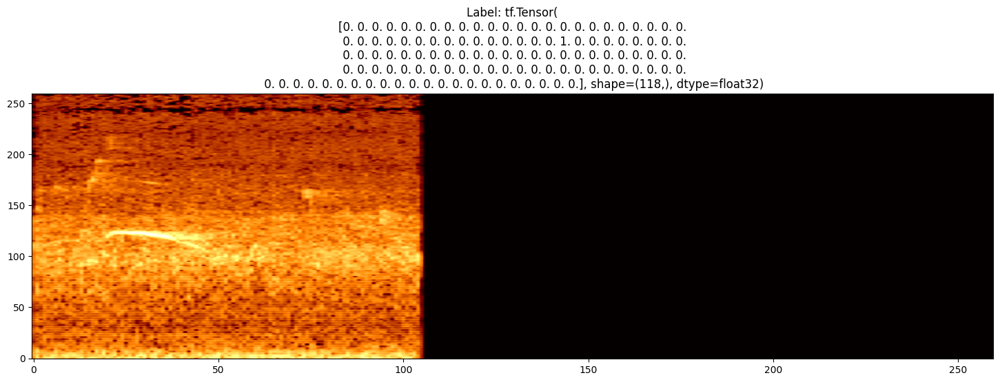

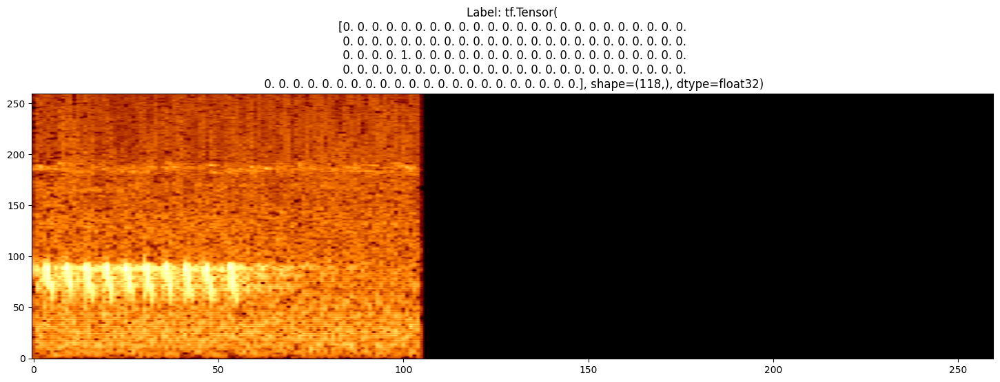

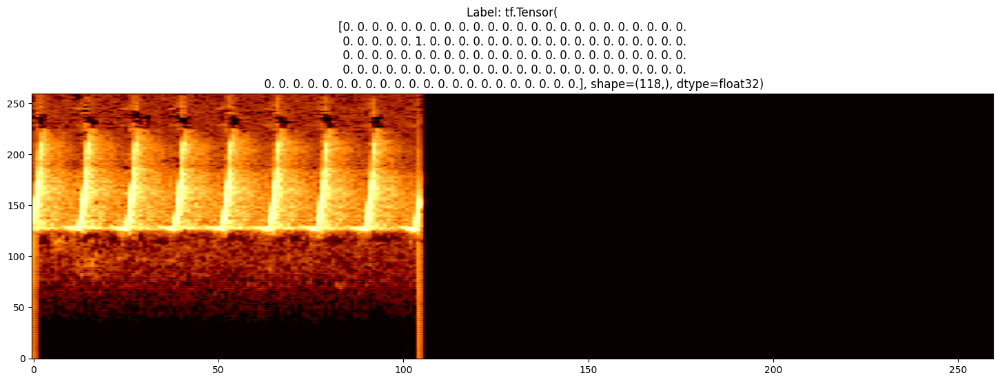

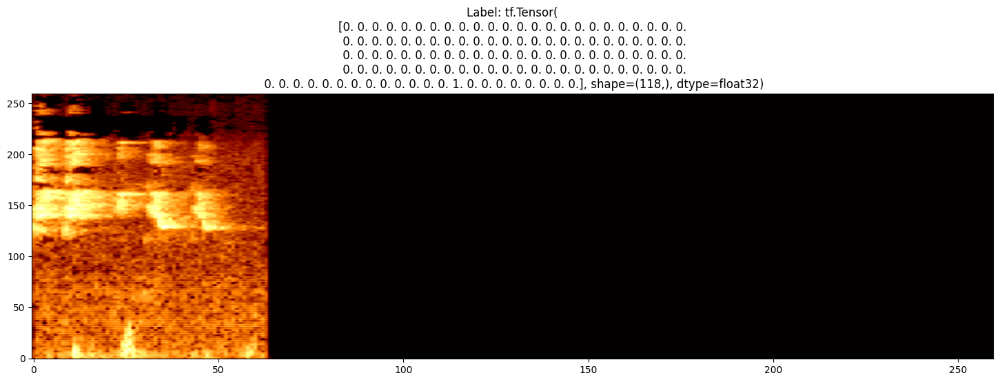

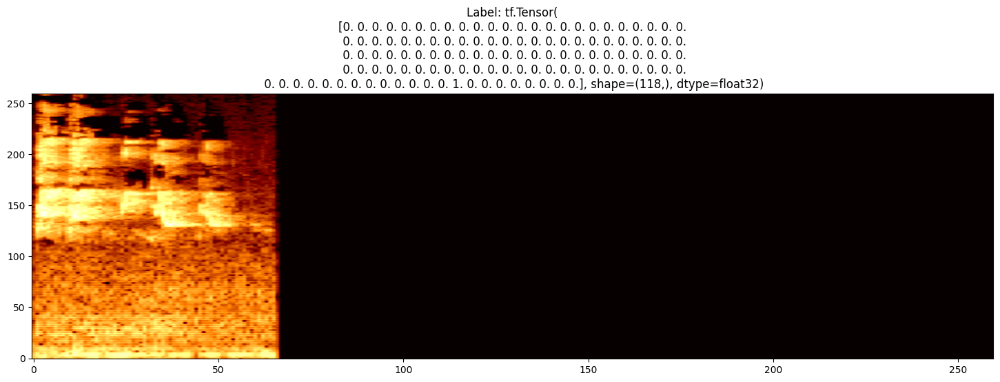

...

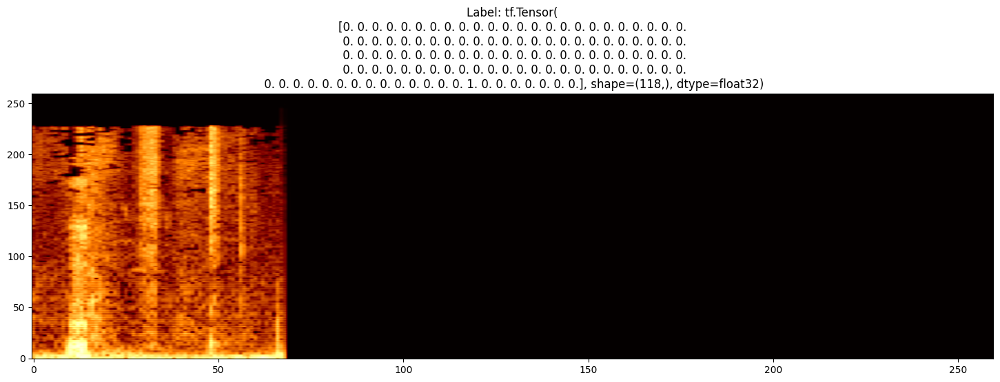

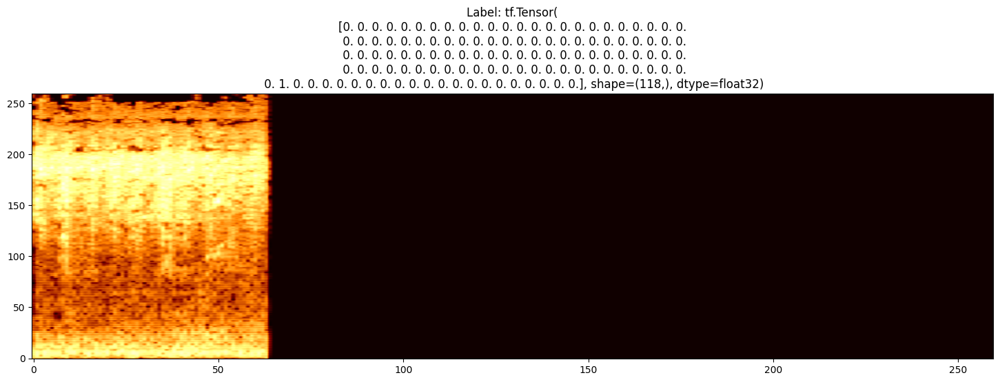

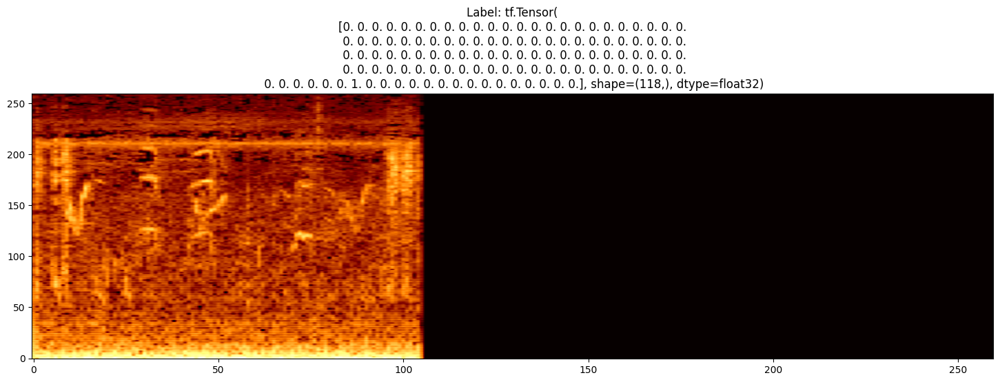

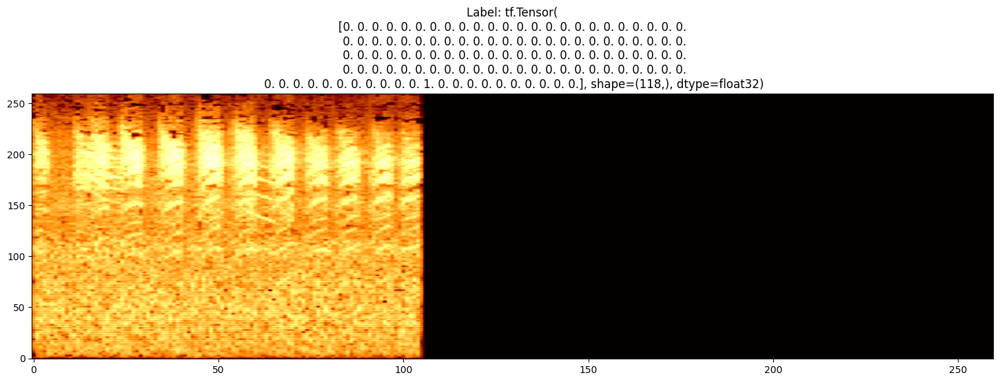

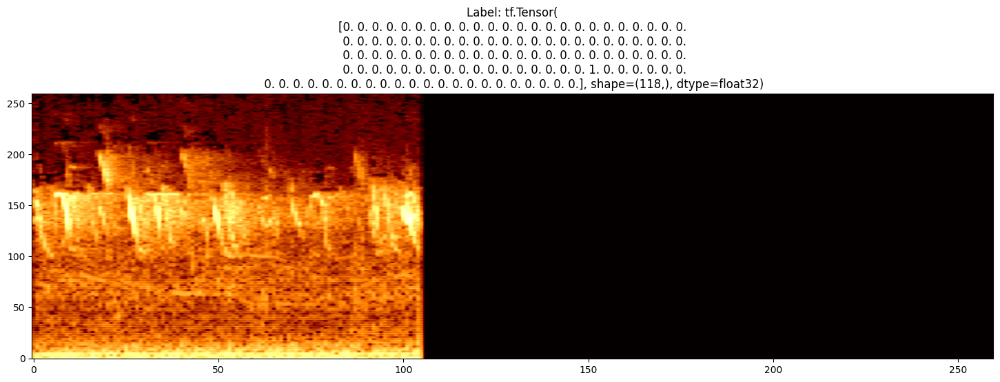

In [109]:
for melspectrogram,label in dataset.take(1):
    print(f' sample info: {melspectrogram.shape}, \n label info: {label.shape} \n {label}')
    for example in range(melspectrogram.shape[0]):
        plt.figure(figsize=(18,5))
        plt.imshow(melspectrogram[example,:,:,0].numpy().T, cmap='afmhot', origin='lower', aspect='auto')
        plt.title('Label: ' + str(label[example,:]))
        plt.show()

### Model Accuracy

Here, we test the accuracy of the model when using the original data. 

#### Load the Saved Model & Test
Load save model from 'src/Components/Engine/models/echo_model/1/' using TFSM Layers

In [81]:
# Load the saved model
model_inference_layer = tf.keras.layers.TFSMLayer(SC['MODEL_DIRECTORY'], call_endpoint='serving_default')

model = tf.keras.Sequential([
    model_inference_layer
])

Now we do the test on the data to calculate the accuracy when the data is of high quality

In [110]:
# Initialize variables to track metrics
true_labels_all = []
predicted_labels_all = []
class_incorrect = defaultdict(int)
class_correct = defaultdict(int)  # Correct predictions per class
class_total = defaultdict(int)  # Total predictions per class

# Run predictions and collect true/predicted labels
for features, labels in dataset:
    predictions_dict = model(features, training=False)
    predictions = predictions_dict['output_0'].numpy()

    for batch_idx in range(predictions.shape[0]):
        # Get the true and predicted classes
        true_class = tf.argmax(labels[batch_idx]).numpy()
        predicted_class = int(tf.argmax(predictions[batch_idx]).numpy())

        true_labels_all.append(true_class)
        predicted_labels_all.append(predicted_class)

        # Update per-class metrics
        class_total[true_class] += 1
        if true_class == predicted_class:
            class_correct[true_class] += 1
        else:
            class_incorrect[true_class] += 1

# Calculate overall accuracy
overall_accuracy = accuracy_score(true_labels_all, predicted_labels_all)
print(f"Overall Accuracy: {overall_accuracy * 100:.2f}%")

# Print metrics per class
print("\nPrediction Results:")
for idx, class_name in enumerate(class_names):
    correct = class_correct[idx]
    incorrect = class_incorrect[idx]
    total = class_total[idx]

    print(f"Class: {class_name}")
    print(f"  Total Predictions: {total}")
    print(f"  Correct Predictions: {correct}")
    print(f"  Incorrect Predictions: {incorrect}")
    print(f"  Accuracy: {correct / total * 100:.2f}%\n")

# Confusion Matrix
conf_matrix = confusion_matrix(true_labels_all, predicted_labels_all)


Overall Accuracy: 98.91%

Prediction Results:
Class: Acanthiza chrysorrhoa
  Total Predictions: 10
  Correct Predictions: 10
  Incorrect Predictions: 0
  Accuracy: 100.00%

Class: Acanthiza lineata
  Total Predictions: 10
  Correct Predictions: 10
  Incorrect Predictions: 0
  Accuracy: 100.00%

Class: Acanthiza nana
  Total Predictions: 10
  Correct Predictions: 10
  Incorrect Predictions: 0
  Accuracy: 100.00%

Class: Acanthiza pusilla
  Total Predictions: 10
  Correct Predictions: 9
  Incorrect Predictions: 1
  Accuracy: 90.00%

Class: Acanthiza reguloides
  Total Predictions: 10
  Correct Predictions: 10
  Incorrect Predictions: 0
  Accuracy: 100.00%

Class: Acanthiza uropygialis
  Total Predictions: 10
  Correct Predictions: 10
  Incorrect Predictions: 0
  Accuracy: 100.00%

Class: Acanthorhynchus tenuirostris
  Total Predictions: 10
  Correct Predictions: 9
  Incorrect Predictions: 1
  Accuracy: 90.00%

Class: Accipiter cirrocephalus
  Total Predictions: 10
  Correct Predictions: 

## Downsampling Sample Rate 4000

In [120]:
SC = {
    'AUDIO_DATA_DIRECTORY': "C:/Users/regin/Documents/SIT374/train_data/b3", #original dataset location.
    'NEW_AUDIO_DATA_DIRECTORY': "C:/Users/regin/Documents/SIT374/new_data4000", #new dataset location.
    'MODEL_DIRECTORY': 'C:/Users/regin/Documents/SIT374/new/Audio Augmentation Comparison/models/2', #directory of the saved_model.pb file
    'CLASS_NAMES_DIRECTORY': "class_names_labels.json", #class names and labels JSON file
    
    'AUDIO_CLIP_DURATION': 5, # seconds 
    'AUDIO_NFFT': 256, #the frequency resolution, if too high, might oversample in the frequency domain
    'AUDIO_WINDOW': None,
    'AUDIO_STRIDE': 50, #depends on the NFFT, is overlap between windows in spectrogram
    'AUDIO_SAMPLE_RATE': 4000, #change to lower sample rate
    'AUDIO_MELS': 128, #number of mel bands, if too high, not meaningful because there's too few frequency to distribute the band
    'AUDIO_FMIN': 20,
    'AUDIO_FMAX': 2000, #because the Nyquist frequency is always half the sampling rate.
    'AUDIO_TOP_DB': 60, #reducing number = more contrast

    'MODEL_INPUT_IMAGE_WIDTH': 260,
    'MODEL_INPUT_IMAGE_HEIGHT': 260,
    'MODEL_INPUT_IMAGE_CHANNELS': 3,

    'MAX_EPOCHS': 10
}

In [111]:
new_directory_4000 = "C:/Users/regin/Documents/SIT374/new_data4000" #new dataset location.

In [36]:
def save_reduced_audio_files(input_dir, output_dir, target_sample_rate):
    """
    Reduces the quality of all audio files in a directory and saves them to a new directory.
    
    Args:
        input_dir (str): Path to the directory containing original audio files.
        output_dir (str): Path to the directory where processed files will be saved.
        target_sample_rate (int): Target sample rate for reduced-quality audio.
    """
    input_dir = Path(input_dir)
    output_dir = Path(output_dir)
    output_dir.mkdir(parents=True, exist_ok=True)  # Create the output directory if it doesn't exist

    # Iterate over each audio file
    for audio_file in input_dir.glob('**/*'):
        if audio_file.suffix.lower() in ['.wav', '.mp3', '.flac', '.ogg']:
            try:
                # Load the audio data
                audio, sr = lb.load(audio_file, sr=SC['AUDIO_SAMPLE_RATE'])  # Load with original sample rate
                
                # Resample the audio to target sample rate
                reduced_audio = lb.resample(audio, orig_sr=sr, target_sr=target_sample_rate)
                
                # Prepare the output file path
                relative_path = audio_file.relative_to(input_dir)  # Keep directory structure
                output_file_path = output_dir / relative_path.with_suffix('.wav')  # Save as WAV
                output_file_path.parent.mkdir(parents=True, exist_ok=True)  # Create subdirectories
                
                # Save the reduced-quality audio
                sf.write(output_file_path, reduced_audio, target_sample_rate)
                
                print(f"Processed and saved: {output_file_path}")
            except Exception as e:
                print(f"Error processing {audio_file}: {e}")

# Call the function to save reduced-quality files
save_reduced_audio_files(SC['AUDIO_DATA_DIRECTORY'], new_directory_4000, target_sample_rate=4000)




Processed and saved: C:\Users\regin\Documents\SIT374\new_data4000\Acanthiza chrysorrhoa\region_11.250-13.250.wav
Processed and saved: C:\Users\regin\Documents\SIT374\new_data4000\Acanthiza chrysorrhoa\region_11.750-13.750.wav
Processed and saved: C:\Users\regin\Documents\SIT374\new_data4000\Acanthiza chrysorrhoa\region_12.800-14.800.wav
Processed and saved: C:\Users\regin\Documents\SIT374\new_data4000\Acanthiza chrysorrhoa\region_13.250-15.250.wav
Processed and saved: C:\Users\regin\Documents\SIT374\new_data4000\Acanthiza chrysorrhoa\region_14.750-16.050.wav
Processed and saved: C:\Users\regin\Documents\SIT374\new_data4000\Acanthiza chrysorrhoa\region_16.750-18.750.wav
Processed and saved: C:\Users\regin\Documents\SIT374\new_data4000\Acanthiza chrysorrhoa\region_17.600-19.600.wav
Processed and saved: C:\Users\regin\Documents\SIT374\new_data4000\Acanthiza chrysorrhoa\region_17.750-19.750.wav
Processed and saved: C:\Users\regin\Documents\SIT374\new_data4000\Acanthiza chrysorrhoa\region_1

In [37]:
from pathlib import Path

def calculate_folder_size(folder_path):
    """
    Calculate the total size of all files in a folder.
    
    Args:
        folder_path (str): Path to the folder.
    
    Returns:
        float: Total size of files in MB.
    """
    folder = Path(folder_path)
    total_size = sum(file.stat().st_size for file in folder.glob('**/*') if file.is_file())
    return total_size / (1024 * 1024)  # Convert to MB



# Calculate and print folder sizes
original_size = calculate_folder_size(SC['AUDIO_DATA_DIRECTORY'])
reduced_size = calculate_folder_size(new_directory_4000)

print(f"Original folder size: {original_size:.2f} MB")
print(f"Reduced-quality folder size: {reduced_size:.2f} MB")


Original folder size: 349.14 MB
Reduced-quality folder size: 154.44 MB


### Low Quality Data preprocessing 4000
now we need to update the previous functions to use the new low quality data with lower sample rate

 sample info: (16, 260, 260, 3), 
 label info: (16, 118) 
 [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


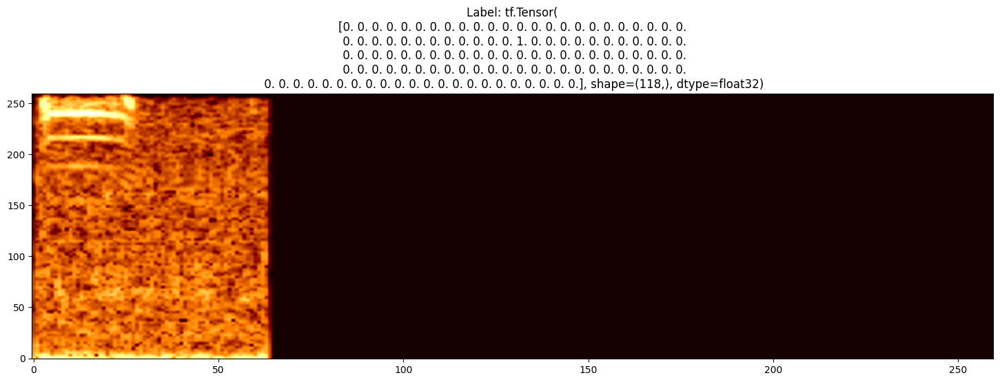

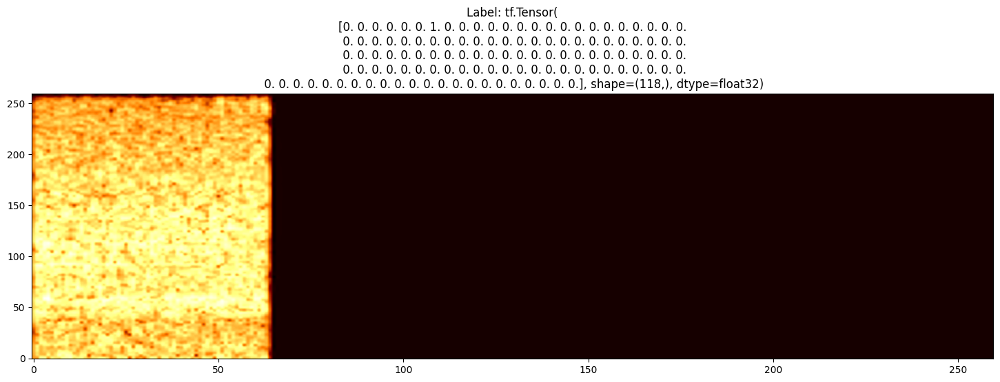

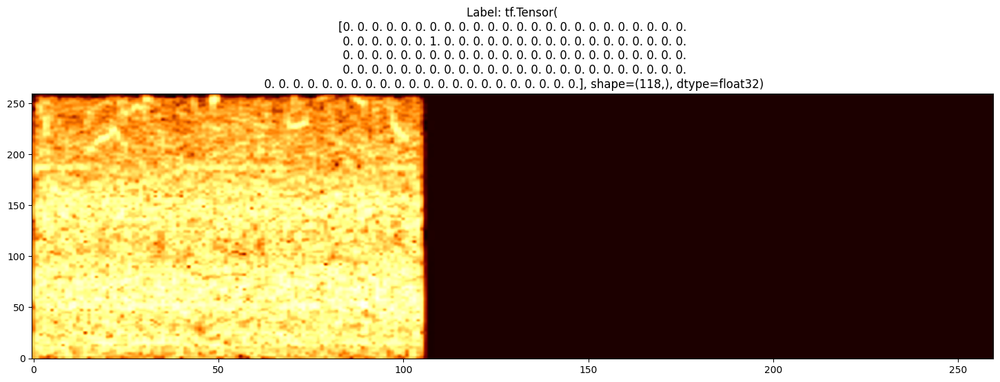

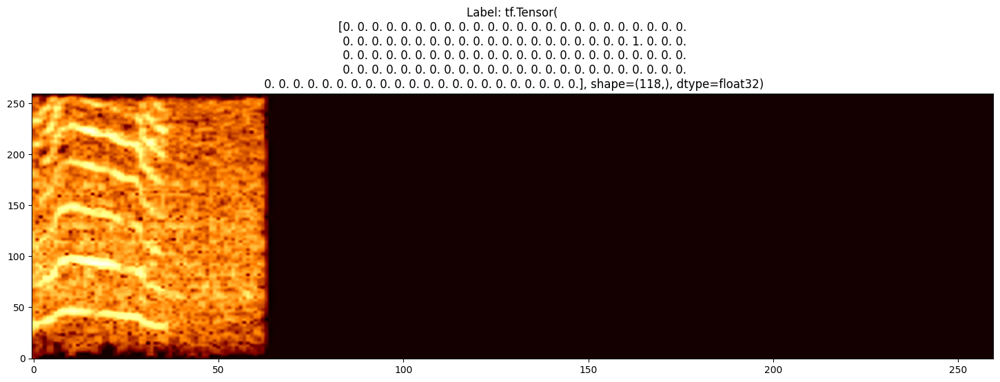

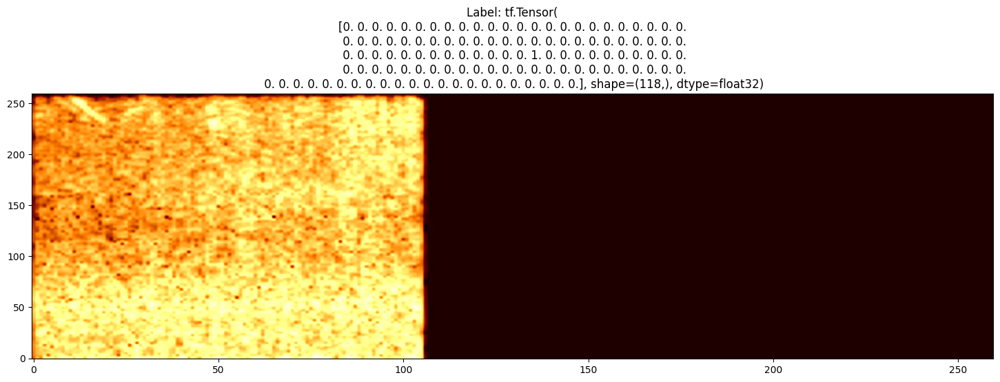

...

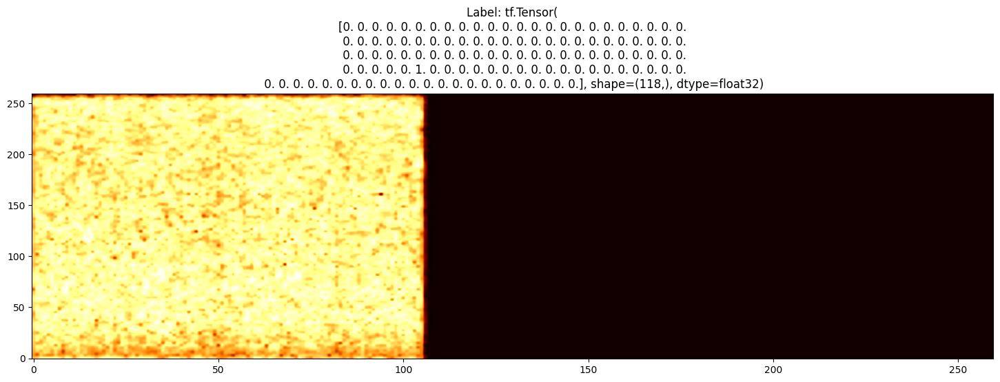

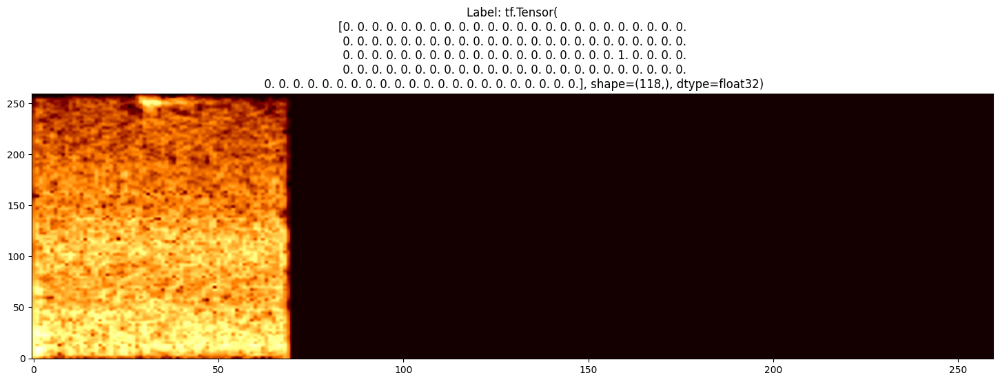

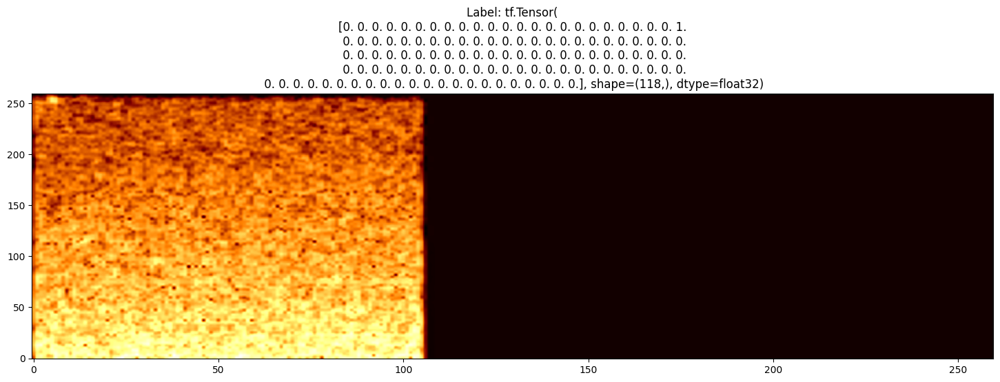

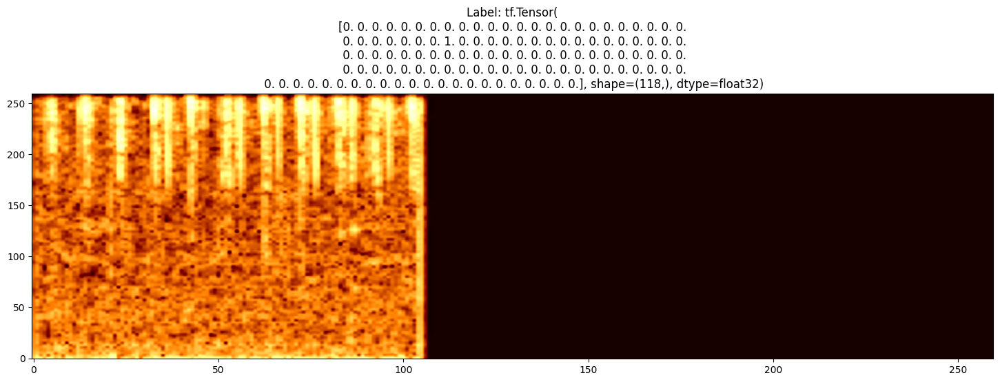

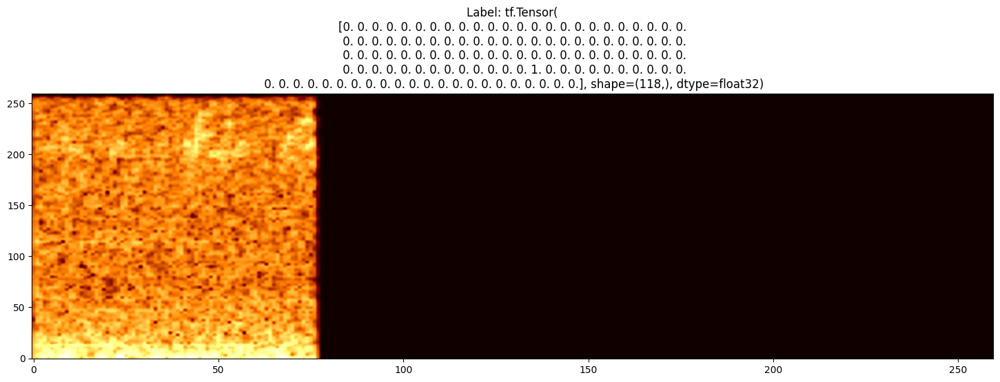

In [121]:
lq_ds = create_datasets(new_directory_4000, class_names, samples = 10)

# Create the training dataset pipeline
lq_dataset = (lq_ds
            .shuffle(len_ds)
            .map(functools.partial(python_function_wrapper, python_load_and_decode_file, procs_output_types), num_parallel_calls=parallel_calls)
            .map(tensorflow_load_random_subsection, num_parallel_calls=parallel_calls)
            # .map(functools.partial(python_function_wrapper, python_audio_augmentations, procs_output_types), num_parallel_calls=parallel_calls)
            .map(functools.partial(python_function_wrapper, python_dataset_melspectro_pipeline, procs_output_types), num_parallel_calls=parallel_calls)
            .map(tensorflow_reshape_image_pipeline, num_parallel_calls=parallel_calls)
        #  .map(tensorflow_image_augmentations, num_parallel_calls=parallel_calls)
            .map(tensorflow_output_shape_setter, num_parallel_calls=parallel_calls)
            .batch(16)
            .prefetch(parallel_calls)
            .repeat(count=1)
)

for melspectrogram,label in lq_dataset.take(1):
    print(f' sample info: {melspectrogram.shape}, \n label info: {label.shape} \n {label}')
    for example in range(melspectrogram.shape[0]):
        plt.figure(figsize=(18,5))
        plt.imshow(melspectrogram[example,:,:,0].numpy().T, cmap='afmhot', origin='lower', aspect='auto')
        plt.title('Label: ' + str(label[example,:]))
        plt.show()

### Predicting output 4000


In [122]:
# Initialize variables to track metrics
true_labels_all4000 = []
predicted_labels_all4000 = []
class_incorrect4000 = defaultdict(int)
class_correct4000 = defaultdict(int)  # Correct predictions per class
class_total4000 = defaultdict(int)  # Total predictions per class

# Run predictions and collect true/predicted labels
for features, labels in lq_dataset:
    predictions_dict = model(features, training=False)
    predictions = predictions_dict['output_0'].numpy()

    for batch_idx in range(predictions.shape[0]):
        # Get the true and predicted classes
        true_class = tf.argmax(labels[batch_idx]).numpy()
        predicted_class = int(tf.argmax(predictions[batch_idx]).numpy())

        true_labels_all4000.append(true_class)
        predicted_labels_all4000.append(predicted_class)

        # Update per-class metrics
        class_total4000[true_class] += 1
        if true_class == predicted_class:
            class_correct4000[true_class] += 1
        else:
            class_incorrect4000[true_class] += 1

# Calculate overall accuracy
overall_accuracy4000 = accuracy_score(true_labels_all4000, predicted_labels_all4000)
print(f"Overall Accuracy: {overall_accuracy4000 * 100:.2f}%")

# Print metrics per class
print("\nPrediction Results:")
for idx, class_name in enumerate(class_names):
    correct = class_correct4000[idx]
    incorrect = class_incorrect4000[idx]
    total = class_total4000[idx]

    print(f"Class: {class_name}")
    print(f"  Total Predictions: {total}")
    print(f"  Correct Predictions: {correct}")
    print(f"  Incorrect Predictions: {incorrect}")
    print(f"  Accuracy: {correct / total * 100:.2f}%\n")

# Confusion Matrix
conf_matrix4000 = confusion_matrix(true_labels_all4000, predicted_labels_all4000)


Overall Accuracy: 6.72%

Prediction Results:
Class: Acanthiza chrysorrhoa
  Total Predictions: 10
  Correct Predictions: 0
  Incorrect Predictions: 10
  Accuracy: 0.00%

Class: Acanthiza lineata
  Total Predictions: 10
  Correct Predictions: 0
  Incorrect Predictions: 10
  Accuracy: 0.00%

Class: Acanthiza nana
  Total Predictions: 10
  Correct Predictions: 0
  Incorrect Predictions: 10
  Accuracy: 0.00%

Class: Acanthiza pusilla
  Total Predictions: 10
  Correct Predictions: 0
  Incorrect Predictions: 10
  Accuracy: 0.00%

Class: Acanthiza reguloides
  Total Predictions: 10
  Correct Predictions: 0
  Incorrect Predictions: 10
  Accuracy: 0.00%

Class: Acanthiza uropygialis
  Total Predictions: 10
  Correct Predictions: 0
  Incorrect Predictions: 10
  Accuracy: 0.00%

Class: Acanthorhynchus tenuirostris
  Total Predictions: 10
  Correct Predictions: 0
  Incorrect Predictions: 10
  Accuracy: 0.00%

Class: Accipiter cirrocephalus
  Total Predictions: 10
  Correct Predictions: 0
  Incorre